In [49]:
from pathlib import Path
train_path=Path(r'C:\Users\SGC\Downloads\distractdriverdetection\imgs\train')
test_path=Path(r'C:\Users\SGC\Downloads\distractdriverdetection\imgs\test')

In [50]:
import os
classes=os.listdir(train_path)
classes

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

In [51]:
X=[]
Y=[]
for cls in classes:
    for img_path in os.listdir(os.path.join(train_path,cls)):
        X.append(img_path)
        Y.append(cls)

In [52]:
import pandas as pd
X=pd.DataFrame(X)
Y=pd.DataFrame(Y)
data=pd.concat([X,Y],axis=1,join='inner')
data.columns=['image_name','class']
data.head()

,image_name,class
0,img_100026.jpg,c0
1,img_10003.jpg,c0
2,img_100050.jpg,c0
3,img_100074.jpg,c0
4,img_10012.jpg,c0


In [53]:
data['class'].value_counts()

c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: class, dtype: int64

<Axes: xlabel='class', ylabel='count'>

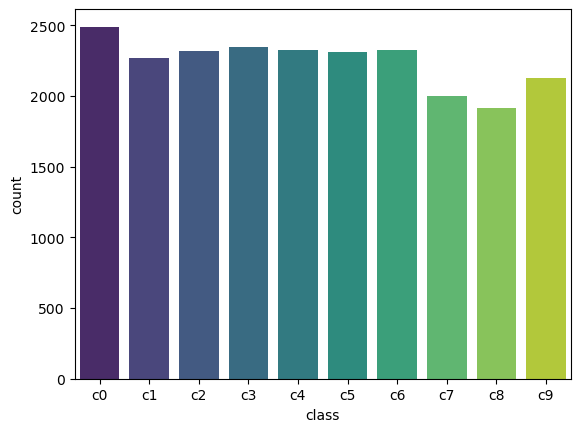

In [54]:
import seaborn as sns
sns.countplot(data,x='class',palette='viridis')

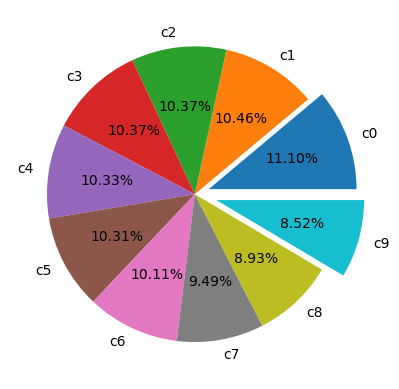

In [55]:
import matplotlib.pyplot as plt
plt.pie(data['class'].value_counts(),labels=classes,autopct='%.2f%%',explode=[0.1,0,0,0,0,0,0,0,0,0.15])
plt.show()

*   ***CO has the highest number of images***
*  ***C9 has the lease number of images***

In [56]:
class_dict = {
    'c0': 'hands on the wheel',
    'c1': 'mobile in right hand',
    'c2': 'talking on the phone with right hand',
    'c3': "mobile in left hand",
    'c4': 'talking on the phone with left hand',
    'c5': 'touching at the dash',
    'c6': 'drinking',
    'c7': 'reaching behind',
    'c8': 'touching the head',
    'c9': 'looking to the side'
}


c0->hands on the wheel


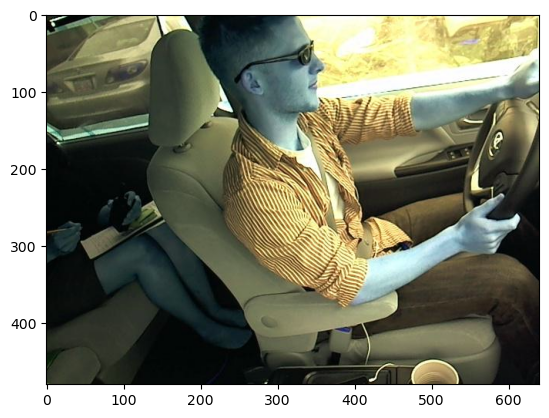



c1->mobile in right hand


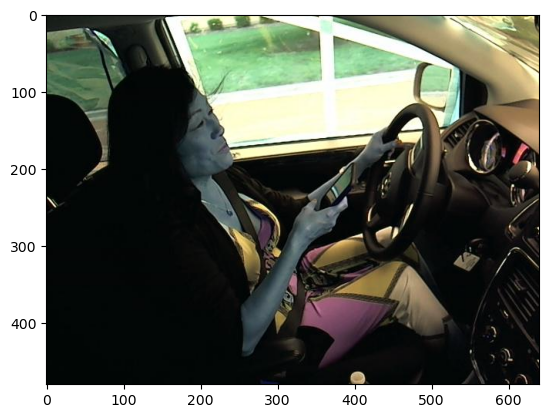



c2->talking on the phone with right hand


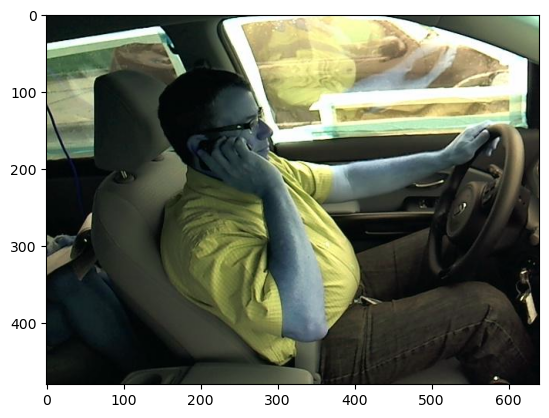



c3->mobile in left hand


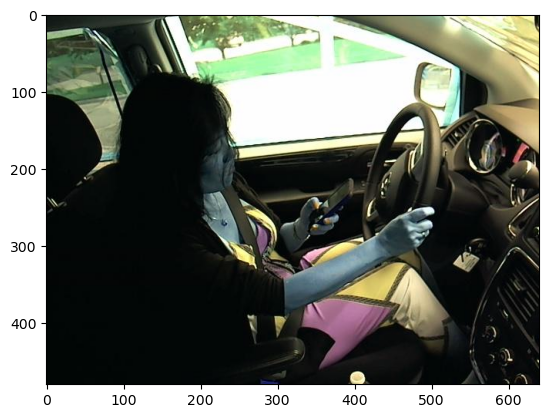



c4->talking on the phone with left hand


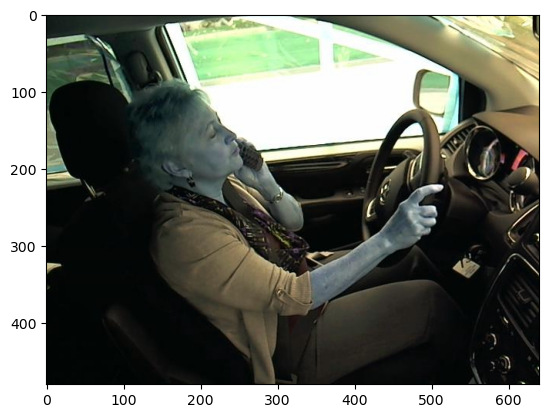



c5->touching at the dash


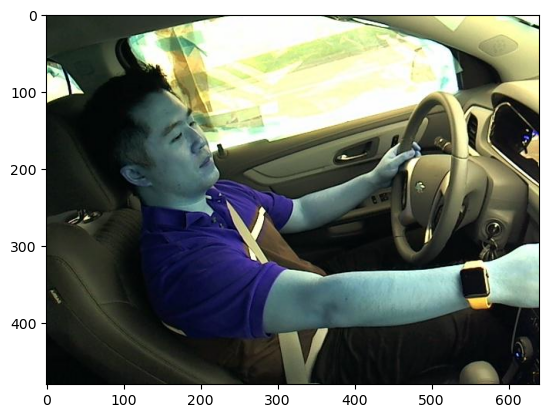



c6->drinking


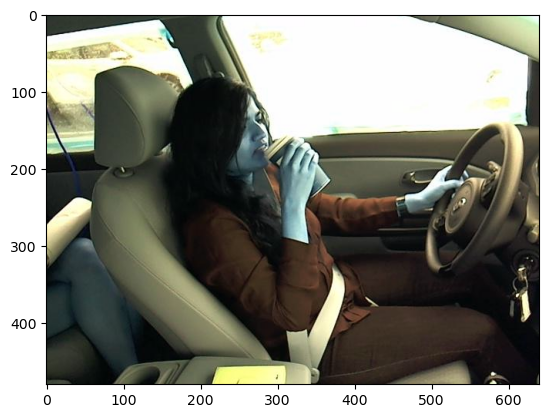



c7->reaching behind


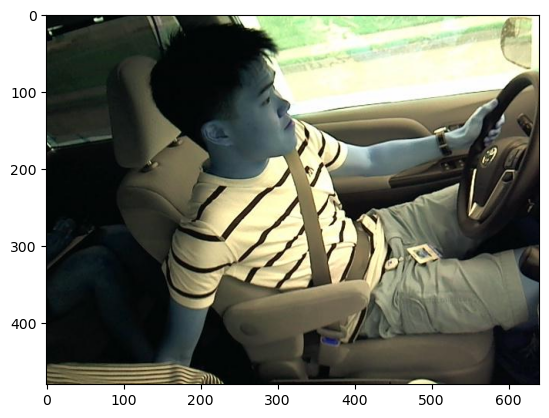



c8->touching the head


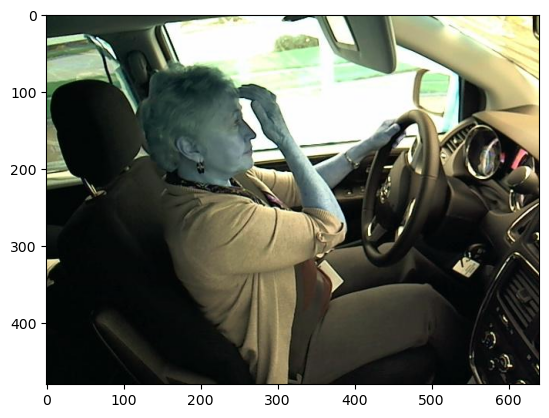



c9->looking to the side


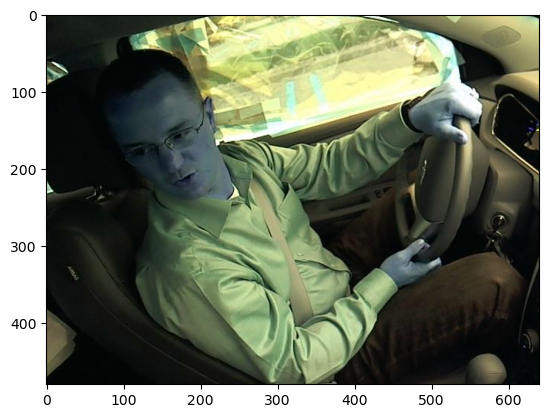

In [57]:
import matplotlib.pyplot as plt
import random
import cv2

for item in classes:
    path = os.path.join(train_path,item)
    count=0
    for image in os.listdir(path):
        image_array =cv2.imread(os.path.join(path,image))
        count+=1
        print(item+"->"+class_dict[item])
        plt.imshow(image_array,cmap='gray')
        plt.show()
        print('\n')
        break

In [58]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        shear_range=0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        fill_mode='nearest',
        validation_split=0.2)

train_data = train_datagen.flow_from_directory(
        train_path,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical',
        subset='training')

validation_data = train_datagen.flow_from_directory(
        train_path,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical',
        subset='validation',
        shuffle=True)

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.


In [59]:
from warnings import filters
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout
import tensorflow as tf

model=Sequential(
    [
      Conv2D(filters=128,kernel_size=(3,3),activation='relu', input_shape=(224,224,3)),
      MaxPool2D(2,2),
      Conv2D(filters=256,kernel_size=(3,3),activation='relu'),
      MaxPool2D(2,2),
      Conv2D(filters=512,kernel_size=(3,3),activation='relu'),
      MaxPool2D(2,2),
      Flatten(),
      Dense(512,activation='relu'),
      Dense(256,activation='relu'),
      Dense(32,activation='relu'),
      Dense(10,activation='softmax')

    ]
)

In [60]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [61]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 256)     295168    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 256)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 512)       1180160   
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 512)      0

In [62]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',patience=3)

In [63]:
model_history=model.fit(train_data, epochs=15,  validation_data=validation_data, callbacks=[early_stop])

Epoch 1/15
561/561 [==============================] - 2165s 4s/step - loss: 1.8005 - accuracy: 0.3250 - val_loss: 1.1301 - val_accuracy: 0.5805
Epoch 2/15
561/561 [==============================] - 2086s 4s/step - loss: 0.8406 - accuracy: 0.7021 - val_loss: 0.6472 - val_accuracy: 0.7755
Epoch 3/15
561/561 [==============================] - 2086s 4s/step - loss: 0.5017 - accuracy: 0.8256 - val_loss: 0.3939 - val_accuracy: 0.8679
Epoch 4/15
561/561 [==============================] - 2087s 4s/step - loss: 0.3641 - accuracy: 0.8754 - val_loss: 0.3361 - val_accuracy: 0.8837
Epoch 5/15
561/561 [==============================] - 2105s 4s/step - loss: 0.2824 - accuracy: 0.9088 - val_loss: 0.2692 - val_accuracy: 0.9154
Epoch 6/15
561/561 [==============================] - 2111s 4s/step - loss: 0.2392 - accuracy: 0.9220 - val_loss: 0.2213 - val_accuracy: 0.9348
Epoch 7/15
561/561 [==============================] - 2116s 4s/step - loss: 0.2066 - accuracy: 0.9320 - val_loss: 0.2259 - val_accuracy:

In [64]:
model.save("distractdriver2.h5")

In [65]:
from tensorflow.keras.models import load_model
loaded_model=load_model('distractdriver2.h5')
loaded_model

In [66]:
loaded_model.predict(validation_data)

141/141 [==============================] - 169s 1s/step


array([[8.9114049e-11, 6.3507819e-06, 3.9980491e-06, ..., 6.2822181e-10,
        2.1948479e-05, 4.8122052e-07],
       [9.4612641e-03, 1.6911681e-05, 3.8713102e-07, ..., 1.0314042e-03,
        1.8972637e-02, 9.3951690e-01],
       [4.1462404e-06, 1.4775926e-06, 3.5000050e-10, ..., 3.3648060e-13,
        4.6307500e-11, 1.8711592e-08],
       ...,
       [8.3644254e-06, 1.4222655e-05, 9.9904066e-01, ..., 9.5615644e-07,
        1.9813421e-04, 1.8502884e-06],
       [3.5249711e-06, 4.7637689e-09, 9.9999332e-01, ..., 2.5076155e-10,
        1.2243797e-06, 1.6172914e-06],
       [1.1708449e-05, 9.9967766e-01, 4.2883633e-07, ..., 1.7023145e-06,
        1.2772877e-05, 2.8973616e-06]], dtype=float32)

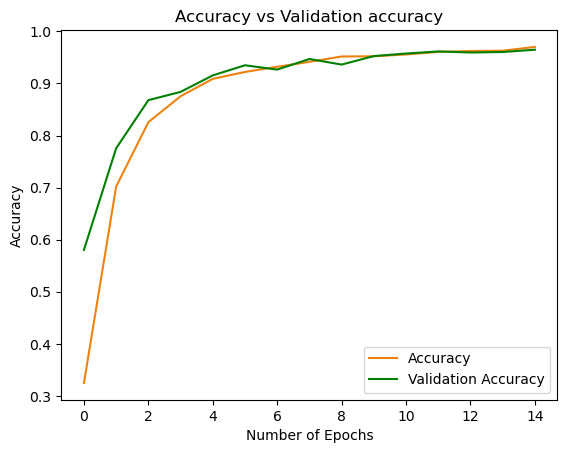

In [67]:
import matplotlib.pyplot as plt
plt.title('Accuracy vs Validation accuracy')
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")
plt.plot(model_history.history['accuracy'],c='#ed820e',label='Accuracy')
plt.plot(model_history.history['val_accuracy'],c='green',label='Validation Accuracy')
plt.legend()

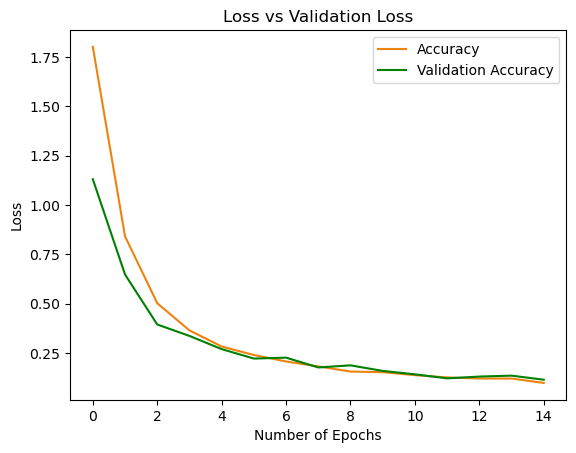

In [68]:
plt.title('Loss vs Validation Loss')
plt.xlabel("Number of Epochs")
plt.ylabel("Loss")
plt.plot(model_history.history['loss'],c='#ed820e',label='Accuracy')
plt.plot(model_history.history['val_loss'],c='green',label='Validation Accuracy')
plt.legend()

In [3]:
import cv2
video=cv2.VideoCapture(0)

In [44]:
import numpy as np
def get_prediction(img):
    img=img.reshape(1,224,224,3)
    y_pred=loaded_model.predict(img)
    y_pred=y_pred[0]
    return class_dict['c'+str(np.where(y_pred==max(y_pred))[0][0])]

In [45]:
def write_label(img,pos,text,bg_color):
    text_size=cv2.getTextSize(text,cv2.FONT_HERSHEY_DUPLEX,1,1)
    end_x=pos[0]+text_size[0][0]+2
    end_y=pos[1]+text_size[0][1]-2
    cv2.rectangle(img,pos,(end_x,end_y),bg_color,cv2.FILLED)
    cv2.putText(img,text,pos,cv2.FONT_HERSHEY_COMPLEX,1,(234,5,0),1,cv2.LINE_AA)
    

In [76]:
while True:
    ret,frame=video.read()
    img=cv2.resize(frame,(224,224))
    y_pred=get_prediction(img)
    write_label(frame,(20,20),y_pred,(123,123,123))
    cv2.imshow("Frame",frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cv2.destroyAllWindows()        


<class 'numpy.ndarray'>
1/1 [==============================] - 0s 263ms/step


# 

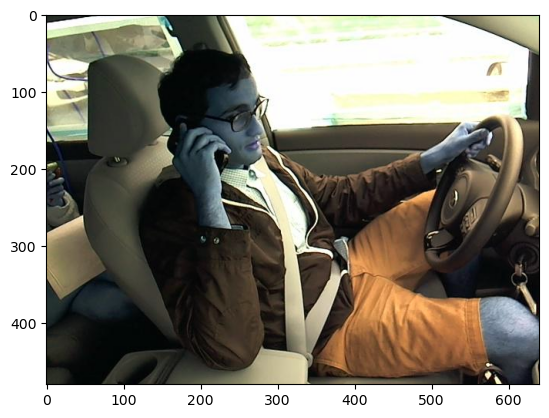

1/1 [==============================] - 0s 122ms/step
Prediction = looking to the side




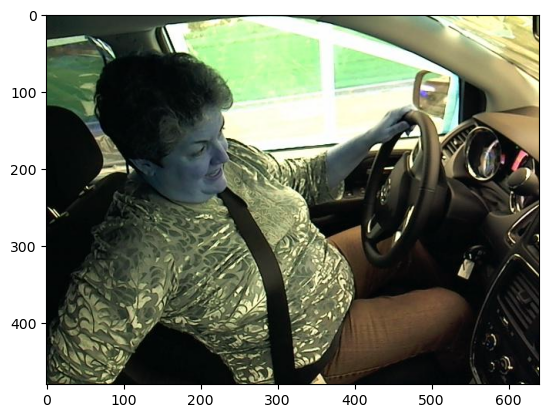

1/1 [==============================] - 0s 80ms/step
Prediction = mobile in right hand




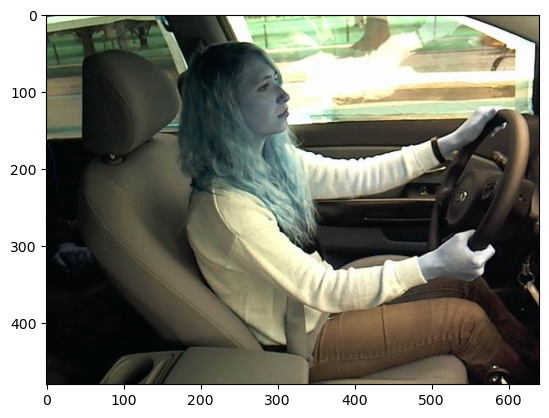

1/1 [==============================] - 0s 78ms/step
Prediction = looking to the side




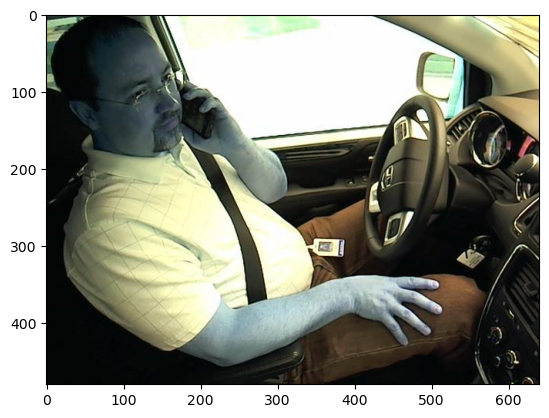

1/1 [==============================] - 0s 77ms/step
Prediction = looking to the side




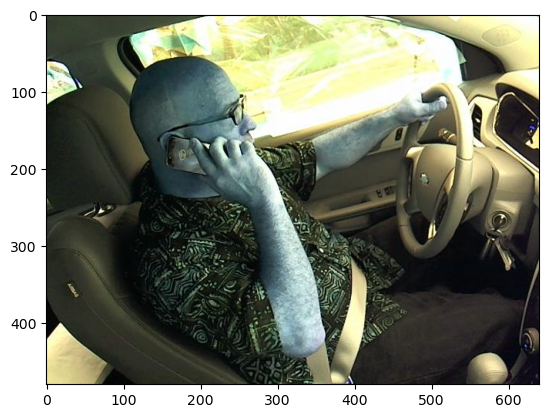

1/1 [==============================] - 0s 80ms/step
Prediction = reaching behind




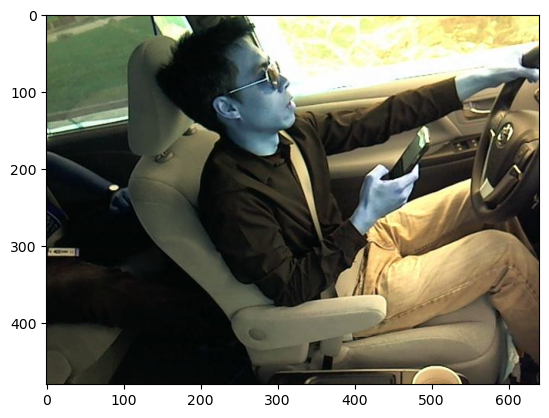

1/1 [==============================] - 0s 76ms/step
Prediction = drinking




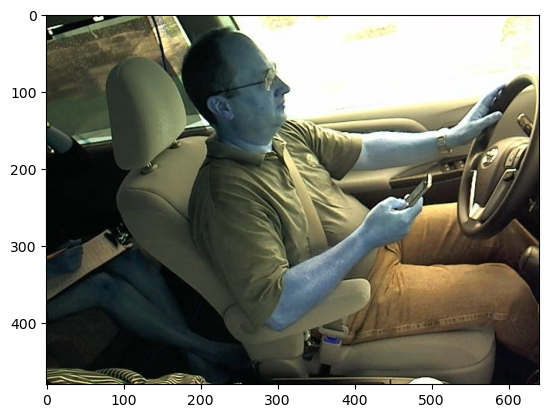

1/1 [==============================] - 0s 78ms/step
Prediction = looking to the side




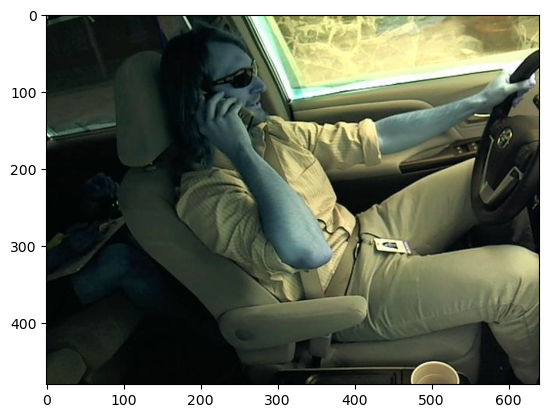

1/1 [==============================] - 0s 79ms/step
Prediction = drinking




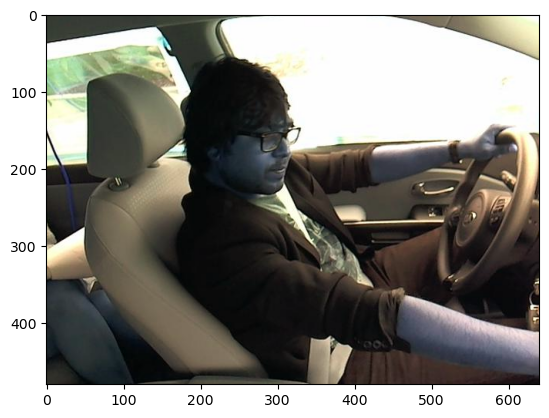

1/1 [==============================] - 0s 78ms/step
Prediction = looking to the side




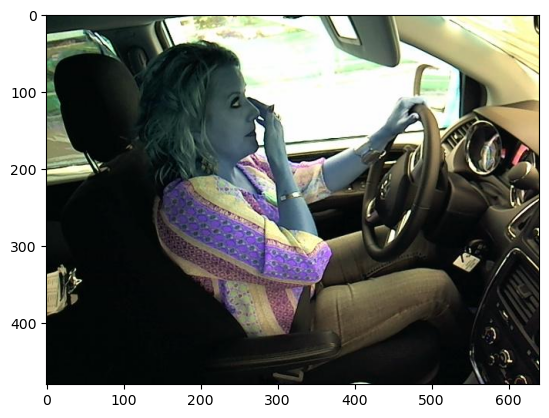

1/1 [==============================] - 0s 75ms/step
Prediction = mobile in right hand




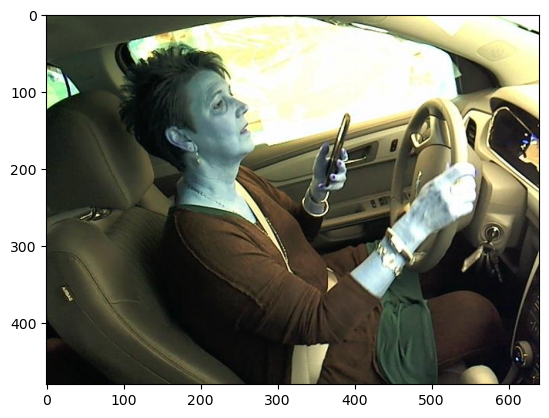

1/1 [==============================] - 0s 74ms/step
Prediction = hands on the wheel




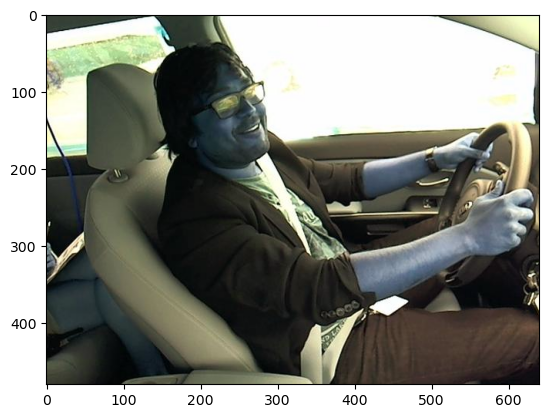

1/1 [==============================] - 0s 84ms/step
Prediction = looking to the side




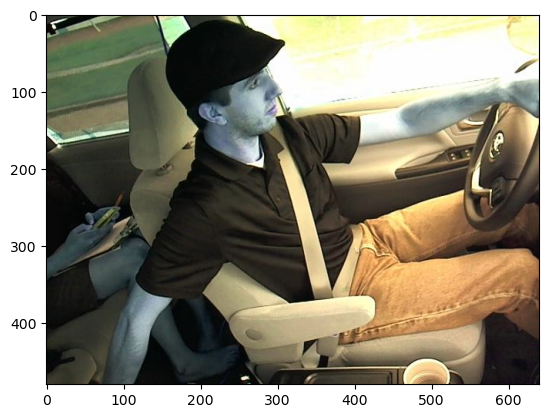

1/1 [==============================] - 0s 76ms/step
Prediction = drinking




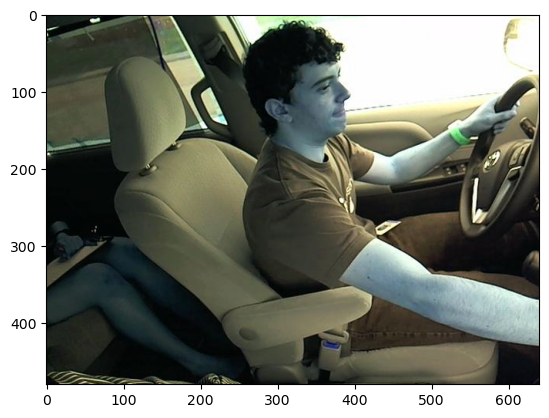

1/1 [==============================] - 0s 80ms/step
Prediction = looking to the side




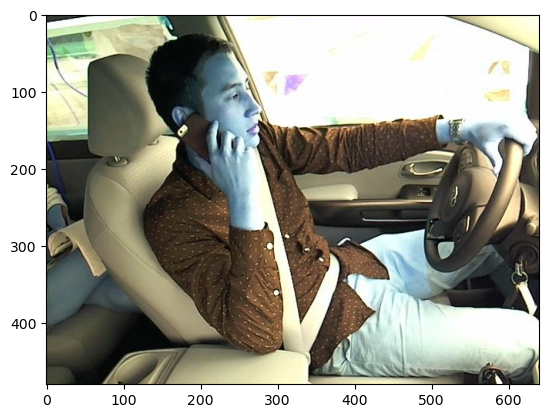

1/1 [==============================] - 0s 80ms/step
Prediction = drinking




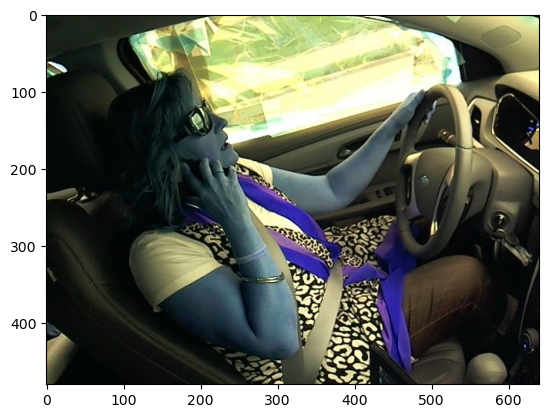

1/1 [==============================] - 0s 83ms/step
Prediction = looking to the side




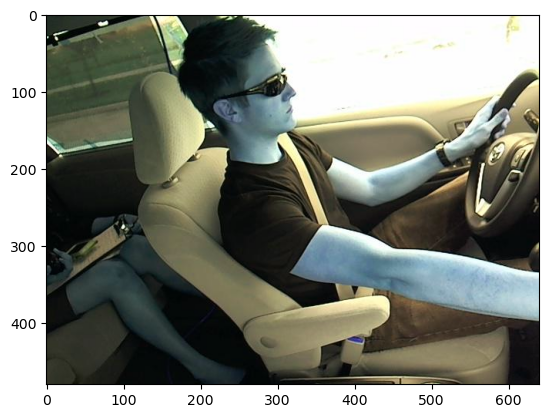

1/1 [==============================] - 0s 83ms/step
Prediction = looking to the side




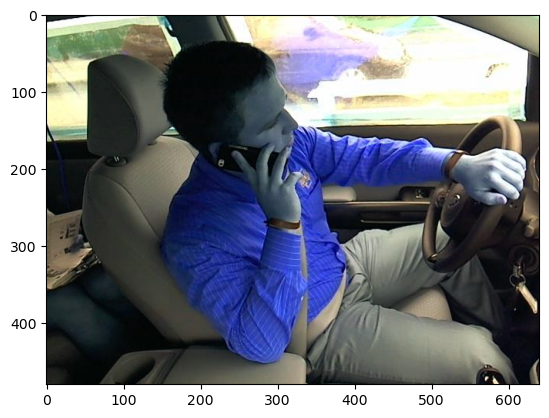

1/1 [==============================] - 0s 88ms/step
Prediction = looking to the side




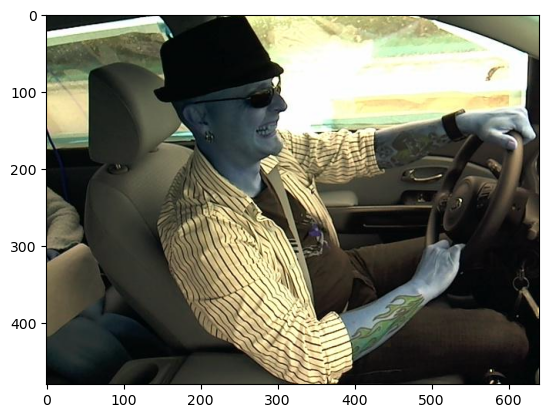

1/1 [==============================] - 0s 79ms/step
Prediction = looking to the side




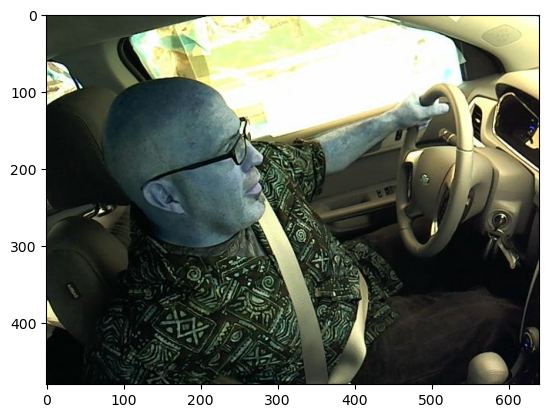

1/1 [==============================] - 0s 76ms/step
Prediction = reaching behind




In [88]:
import random
for i in range(20):
    x=random.randint(1,1000)
    image=cv2.imread(os.path.join(test_path,os.listdir(test_path)[x]))
    plt.imshow(image)
    plt.show()
    image=cv2.resize(image,(224,224))
    y_pred=get_prediction(image)
    print('Prediction =',y_pred)
    print('\n')
